<a href="https://www.kaggle.com/code/subhajeetdas/email-spam-detection?scriptVersionId=125877751" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

# Import libraries

In [1]:
!pip install xgboost

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import GaussianNB, MultinomialNB
from xgboost import XGBClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import precision_score, recall_score, accuracy_score, f1_score, confusion_matrix, ConfusionMatrixDisplay


import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

import warnings
warnings.filterwarnings("ignore")

/kaggle/input/email-spam-classification-dataset-csv/emails.csv


# Loading Data

In [3]:
df = pd.read_csv("/kaggle/input/email-spam-classification-dataset-csv/emails.csv")

In [4]:
df

,Email No.,the,to,ect,and,for,of,a,you,hou,...,connevey,jay,valued,lay,infrastructure,military,allowing,ff,dry,Prediction
0,Email 1,0,0,1,0,0,0,2,0,0,...,0,0,0,0,0,0,0,0,0,0
1,Email 2,8,13,24,6,6,2,102,1,27,...,0,0,0,0,0,0,0,1,0,0
2,Email 3,0,0,1,0,0,0,8,0,0,...,0,0,0,0,0,0,0,0,0,0
3,Email 4,0,5,22,0,5,1,51,2,10,...,0,0,0,0,0,0,0,0,0,0
4,Email 5,7,6,17,1,5,2,57,0,9,...,0,0,0,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5167,Email 5168,2,2,2,3,0,0,32,0,0,...,0,0,0,0,0,0,0,0,0,0
5168,Email 5169,35,27,11,2,6,5,151,4,3,...,0,0,0,0,0,0,0,1,0,0
5169,Email 5170,0,0,1,1,0,0,11,0,0,...,0,0,0,0,0,0,0,0,0,1
5170,Email 5171,2,7,1,0,2,1,28,2,0,...,0,0,0,0,0,0,0,1,0,1


In [5]:
df.isnull().sum()

Email No.     0
the           0
to            0
ect           0
and           0
             ..
military      0
allowing      0
ff            0
dry           0
Prediction    0
Length: 3002, dtype: int64

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5172 entries, 0 to 5171
Columns: 3002 entries, Email No. to Prediction
dtypes: int64(3001), object(1)
memory usage: 118.5+ MB


<AxesSubplot:>

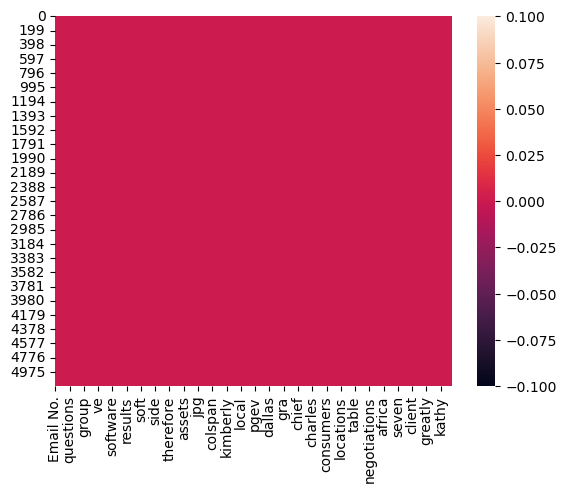

In [7]:
sns.heatmap(df.isnull())

In [8]:
df = df.iloc[:, 1:]

In [9]:
df

,the,to,ect,and,for,of,a,you,hou,in,...,connevey,jay,valued,lay,infrastructure,military,allowing,ff,dry,Prediction
0,0,0,1,0,0,0,2,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,8,13,24,6,6,2,102,1,27,18,...,0,0,0,0,0,0,0,1,0,0
2,0,0,1,0,0,0,8,0,0,4,...,0,0,0,0,0,0,0,0,0,0
3,0,5,22,0,5,1,51,2,10,1,...,0,0,0,0,0,0,0,0,0,0
4,7,6,17,1,5,2,57,0,9,3,...,0,0,0,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5167,2,2,2,3,0,0,32,0,0,5,...,0,0,0,0,0,0,0,0,0,0
5168,35,27,11,2,6,5,151,4,3,23,...,0,0,0,0,0,0,0,1,0,0
5169,0,0,1,1,0,0,11,0,0,1,...,0,0,0,0,0,0,0,0,0,1
5170,2,7,1,0,2,1,28,2,0,8,...,0,0,0,0,0,0,0,1,0,1


In [10]:
df.nunique()

the           90
to            72
ect           90
and           53
for           42
              ..
military       4
allowing       3
ff            23
dry            4
Prediction     2
Length: 3001, dtype: int64

In [11]:
x = df.iloc[:, :3000].values
x

array([[ 0,  0,  1, ...,  0,  0,  0],
       [ 8, 13, 24, ...,  0,  1,  0],
       [ 0,  0,  1, ...,  0,  0,  0],
       ...,
       [ 0,  0,  1, ...,  0,  0,  0],
       [ 2,  7,  1, ...,  0,  1,  0],
       [22, 24,  5, ...,  0,  0,  0]])

In [12]:
y = df.iloc[:, -1].values
y

array([0, 0, 0, ..., 1, 1, 0])

# Train and Test Splitting the Data

In [13]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.3, random_state = 1)

# Function to Measure Performance & Show Confusion Matrix

In [14]:
def perform(y_pred):
    print("Precision : ", precision_score(y_test, y_pred))
    print("Recall : ", recall_score(y_test, y_pred))
    print("Accuracy Score : ", accuracy_score(y_test, y_pred))
    print("F1 Score : ", f1_score(y_test, y_pred))
    print("\n", confusion_matrix(y_test, y_pred))
    print("")
    
    cm_display = ConfusionMatrixDisplay(confusion_matrix = confusion_matrix(y_test, y_pred), display_labels=['Spam', 'Not Spam'] )
    cm_display.plot()
    plt.show()


# Gaussian Naive Bayes

In [15]:
model_nb = GaussianNB()
model_nb.fit(x_train, y_train)

GaussianNB()

In [16]:
y_pred_nb = model_nb.predict(x_test)

Precision :  0.9079497907949791
Recall :  0.9559471365638766
Accuracy Score :  0.9587628865979382
F1 Score :  0.9313304721030043

 [[1054   44]
 [  20  434]]



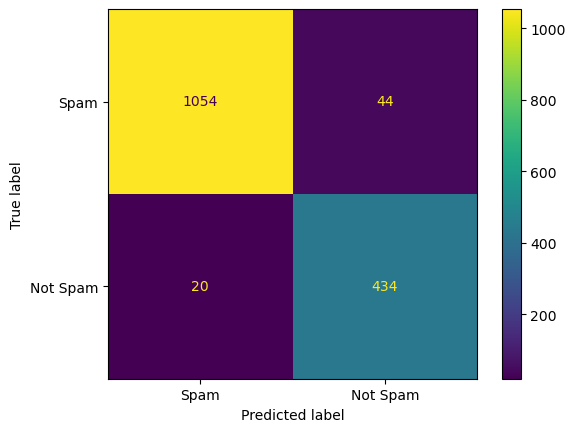

In [17]:
perform(y_pred_nb)

# Multinomial Naive Bayes

In [18]:
model_mnb = MultinomialNB()
model_mnb.fit(x_train, y_train)

MultinomialNB()

In [19]:
y_pred_mnb = model_mnb.predict(x_test)

Precision :  0.8732394366197183
Recall :  0.9559471365638766
Accuracy Score :  0.946520618556701
F1 Score :  0.9127234490010515

 [[1035   63]
 [  20  434]]



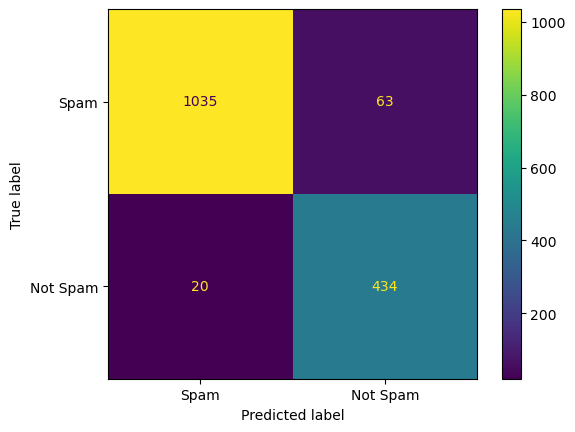

In [20]:
perform(y_pred_mnb)

# XGBoost Classifier

In [21]:
xgb = XGBClassifier().fit(x_train, y_train)

In [22]:
y_pred_xgb = xgb.predict(x_test)

Precision :  0.960352422907489
Recall :  0.960352422907489
Accuracy Score :  0.9768041237113402
F1 Score :  0.960352422907489

 [[1080   18]
 [  18  436]]



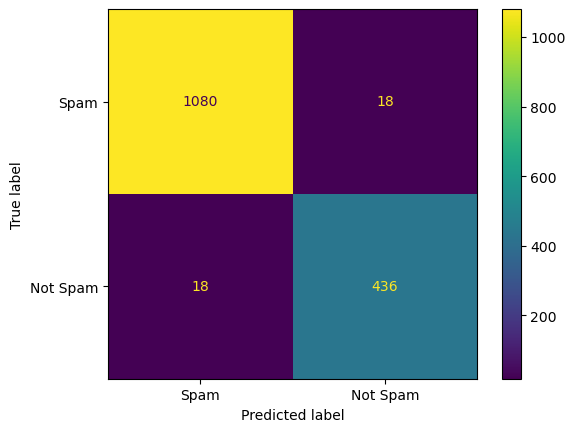

In [23]:
perform(y_pred_xgb)

# Decision Tree

In [24]:
model_dt = DecisionTreeClassifier()
model_dt.fit(x_train, y_train)

DecisionTreeClassifier()

In [25]:
y_pred_dt = model_dt.predict(x_test)

Precision :  0.8840262582056893
Recall :  0.8898678414096917
Accuracy Score :  0.9336340206185567
F1 Score :  0.8869374313940726

 [[1045   53]
 [  50  404]]



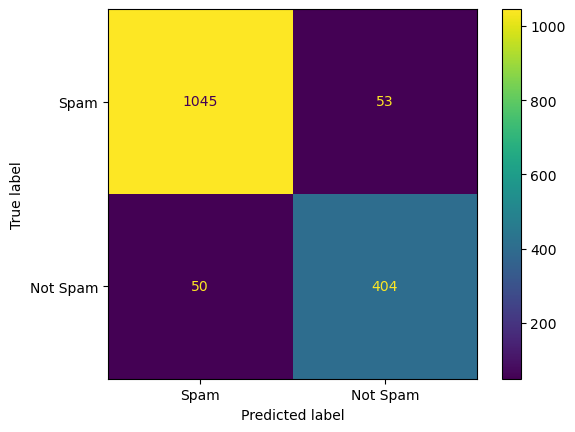

In [26]:
perform(y_pred_dt)

## Decision Tree Visualization

In [27]:
feature_names = df.columns[0:3000]
viz = df.copy()
viz["Prediction"]=viz["Prediction"].values.astype(str)
print(viz.dtypes)
target_names = viz['Prediction'].unique().tolist()

the            int64
to             int64
ect            int64
and            int64
for            int64
               ...  
military       int64
allowing       int64
ff             int64
dry            int64
Prediction    object
Length: 3001, dtype: object


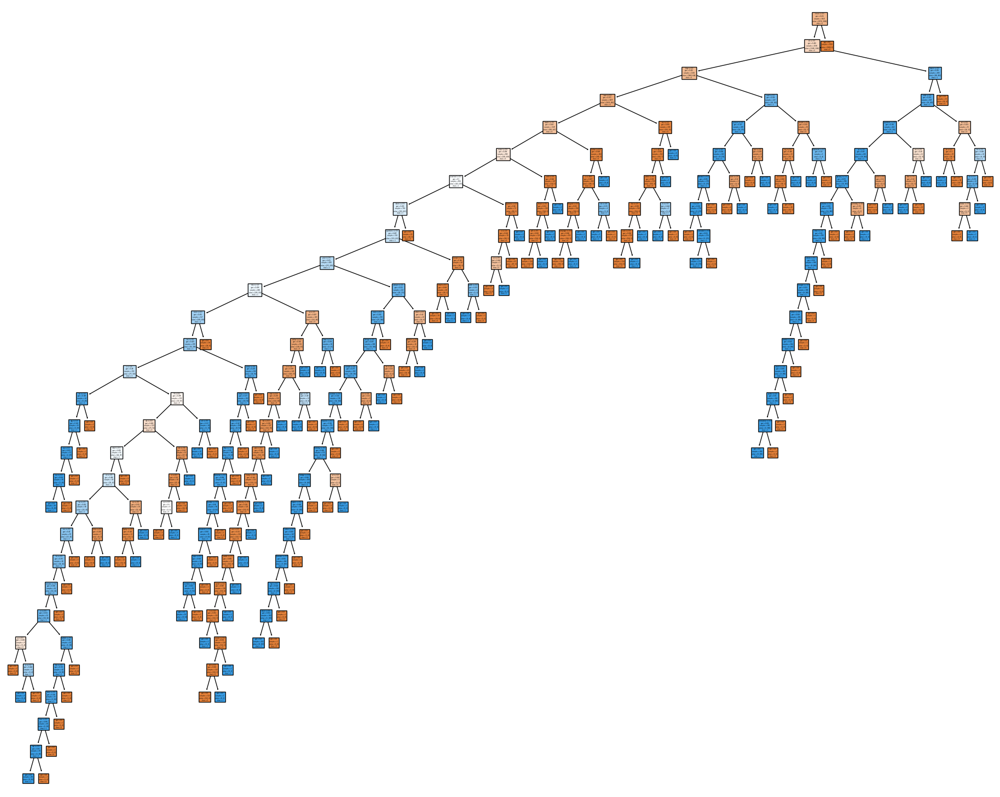

In [28]:
from sklearn.tree import plot_tree # tree diagram

plt.figure(figsize=(25, 20))
plot_tree(model_dt, feature_names = feature_names, class_names = target_names, filled = True, rounded = False)

plt.savefig('tree_visualization.png')

# Random Forest

In [29]:
model_rf = RandomForestClassifier(criterion="entropy")
model_rf.fit(x_train, y_train)

RandomForestClassifier(criterion='entropy')

In [30]:
y_pred_rf = model_rf.predict(x_test)

Precision :  0.9490022172949002
Recall :  0.9427312775330396
Accuracy Score :  0.9684278350515464
F1 Score :  0.9458563535911602

 [[1075   23]
 [  26  428]]



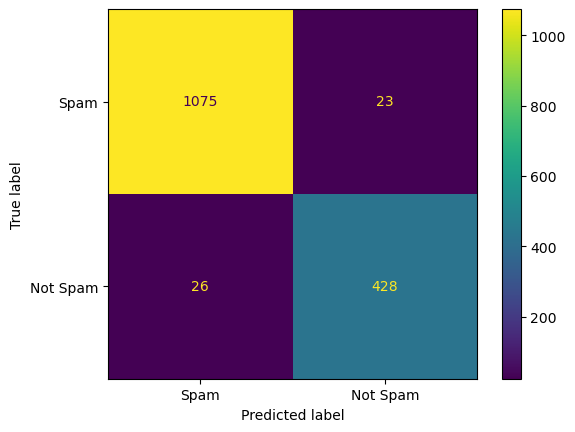

In [31]:
perform(y_pred_rf)

## Random Forest Visualization

In [32]:
estimator = model_rf.estimators_[50]
estimator

DecisionTreeClassifier(criterion='entropy', max_features='auto',
                       random_state=800049983)

In [33]:
from sklearn.tree import export_graphviz
export_graphviz(estimator, out_file='Random_forest.dot', feature_names = feature_names,
                class_names = target_names,
                rounded = True, proportion = False, precision = 2, filled = True)

In [34]:
!dot -Tpng Random_forest.dot -o Random_forest.png -Gdpi=600

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.382569 to fit


In [35]:
from IPython.display import Image
Image(filename = 'Random_forest.png')

# Logistic Regression

In [36]:
model_lr = LogisticRegression(max_iter = 700)
model_lr.fit(x_train, y_train)

LogisticRegression(max_iter=700)

In [37]:
y_pred_lr = model_lr.predict(x_test)

Precision :  0.9488888888888889
Recall :  0.9405286343612335
Accuracy Score :  0.9677835051546392
F1 Score :  0.9446902654867257

 [[1075   23]
 [  27  427]]



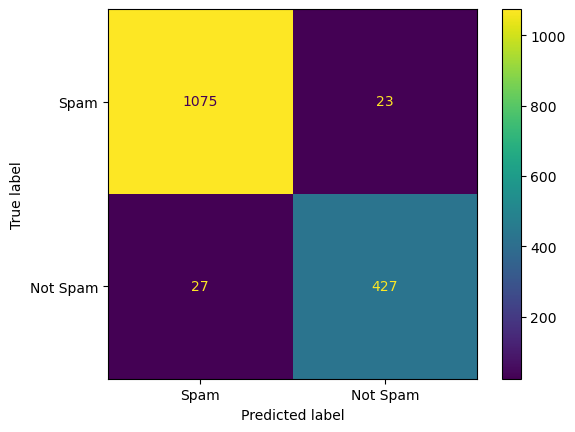

In [38]:
perform(y_pred_lr)

<br>
<p style="text-align:center; font-weight:800; font-size:18px"><em>Thank you! For viewing this Notebook, do upvote if you like it and please feel free to provide feedback.</em><br>
<br>    
<p style="text-align:center"><img src="https://cliply.co/wp-content/uploads/2021/08/472108170_THANK_YOU_STICKER_400px.gif" width="480" height="373"></p>